In [42]:
from scipy.signal import convolve2d

import cv2

import numpy as np
import skimage as sk
import skimage.io as skio


import matplotlib.pyplot as plt

from PIL import Image as im

import glob


import math

In [108]:
def display_grid_of_images(array_of_images, array_of_names, w = 6, h = 5):
    num_rows = len(array_of_images)
    num_cols = len(array_of_images[0])
    
    assert len(array_of_names) == num_rows, "same num of rows for names and images"
    
    assert all([len(row) == num_cols for row in array_of_images]), "all rows need to be same length"
    assert all([len(row) == num_cols for row in array_of_names]), "all rows need to be same length for strings too"
    
    fig = plt.figure(figsize=(w * num_cols, h * num_rows))
    subplots = fig.subplots(num_rows, num_cols)
    
    for row in range(num_rows):
        for col in range(num_cols):
            
            ax = subplots[row, col]
            ax.set_title(array_of_names[row][col])
            pixels = array_of_images[row][col]
            
            if len(pixels.shape) == 2:
                # grayscale (scalars)
                ax.imshow(pixels,cmap='Greys_r')
            if len(pixels.shape) == 3:
                # rgb
                ax.imshow(pixels)

In [109]:
def display_dictionary_of_images(dic, prefix = '', horiz = False, w = 6, h = 5):
    %matplotlib inline
    
    if horiz:
    
        fig = plt.figure(figsize=(w * len(dic), h))
        try:
            subplots = list(fig.subplots(1, len(dic)))
        except:
            subplots = [fig.subplots(1, len(dic))]
    else:
        fig = plt.figure(figsize=(w, h * len(dic)))
        try:
            subplots = list(fig.subplots(len(dic), 1))
        except:
            subplots = [fig.subplots(len(dic), 1)]
    
    keylist = list(dic.keys())
    
    for i in range(len(dic)):
        key = keylist[i]      
        pixels = dic[key]

        #Display the image
        ax = subplots[i]
        ax.set_title(prefix + ' ' + key)
        if len(pixels.shape) == 2:
            # grayscale (scalars)
            ax.imshow(pixels,cmap='Greys_r')
        if len(pixels.shape) == 3:
            # rgb
            ax.imshow(pixels)

# Part 1 Fun with Filters

## 1.1 Finite Difference Operator

In [16]:
cameraman = sk.img_as_float(skio.imread('data/cameraman.png', as_gray = True))

In [18]:
cameraman.shape

(542, 540)

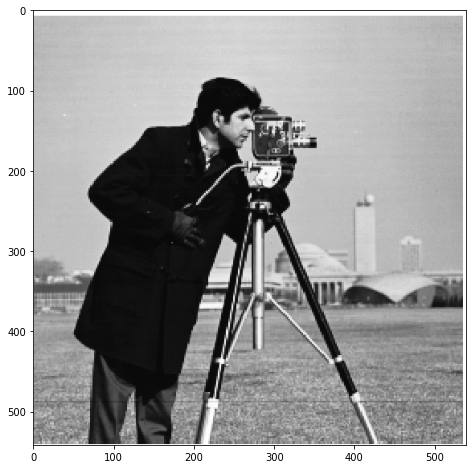

In [19]:
plt.figure(figsize = (8,8))
plt.imshow(cameraman,cmap='Greys_r', vmin=0, vmax=1)

In [22]:
cameraman_dx = convolve2d(cameraman, np.array([[1,-1]]), mode='same')
cameraman_dy = convolve2d(cameraman, np.array([[1],[-1]]), mode='same')
cameraman_magnitude = np.sqrt(cameraman_dx**2 + cameraman_dy**2)

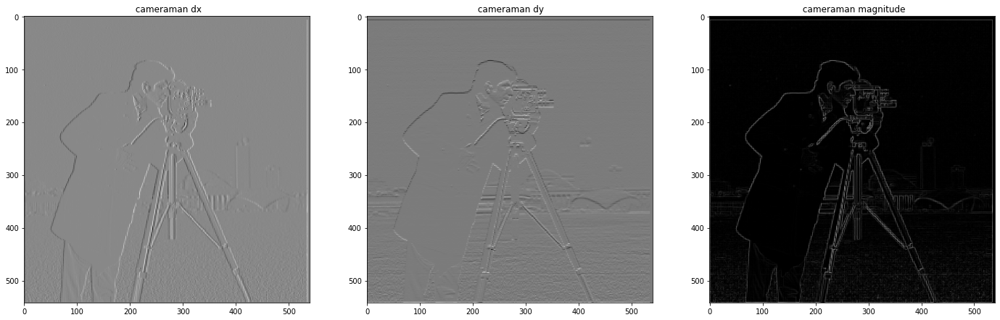

In [110]:
display_dictionary_of_images({
    'cameraman dx': cameraman_dx,
    'cameraman dy': cameraman_dy,
    'cameraman magnitude': cameraman_magnitude
}, horiz = True, w = 8, h = 8)

### Finding the right threshold

In [29]:
np.max(cameraman_magnitude)

1.4142135623730951

In [83]:
arrays = []
names = []
for i in np.arange(0, 0.4, 0.1):
    row_arr = []
    row_name = []
    for j in np.arange(0, 0.1, 0.025):
        threshold = i + j
        row_name.append(f"theshold {threshold}")
        row_arr.append((cameraman_magnitude > threshold).astype(float))
    arrays.append(row_arr)
    names.append(row_name)

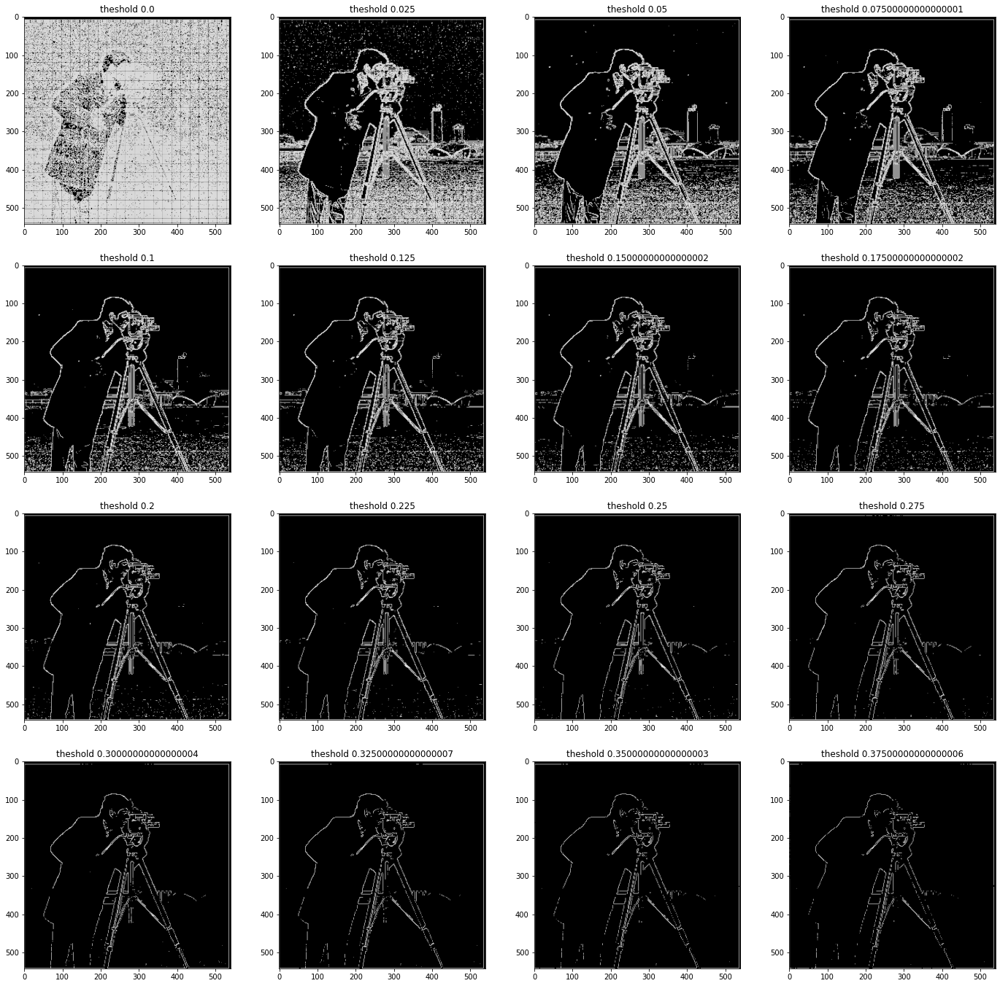

In [111]:
display_grid_of_images(arrays, names, w = 6, h = 6)

I think 0.125 is a good threshold; it is high enough so that there aren't lines all over the guy's face and coat, but it is still low enough so that the buildings in the background are still mostly visible.

I don't think it is possible to find a perfect threshold if we are limited to a constant throughout the whole image, because the non-edges in some regions (such as the grass, and the guy's face) actually have stronger gradients than some of the actual edges in other regions (such as the buildings in the background.)

But anyway, here is threshold 0.125:

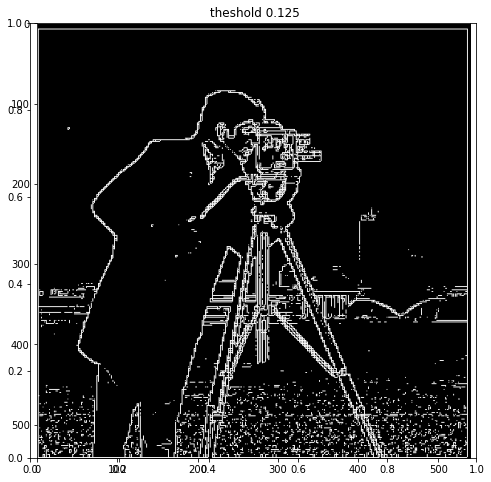

In [112]:
display_dictionary_of_images({
    names[1][1]:arrays[1][1]
}, horiz = True, w = 8, h = 8)

## 1.2 DoG

I'm not sure which value to use for kernel size of gaussian blur, so I tried a bunch of values to visually see which one looks the best.

I decided to go with kernel size 9, which blurred out most of the noise but still allowed the things in the image to be distinguishable.

In [153]:
def gaussian_filter(kernel):
    a = cv2.getGaussianKernel(kernel,-1)
    return np.outer(a,a)

In [69]:
kernel_size = 9
a = cv2.getGaussianKernel(kernel_size, -1)
gaus2d = np.outer(a,a)
cameraman_blurred_9 = convolve2d(cameraman, gaus2d, mode='same')

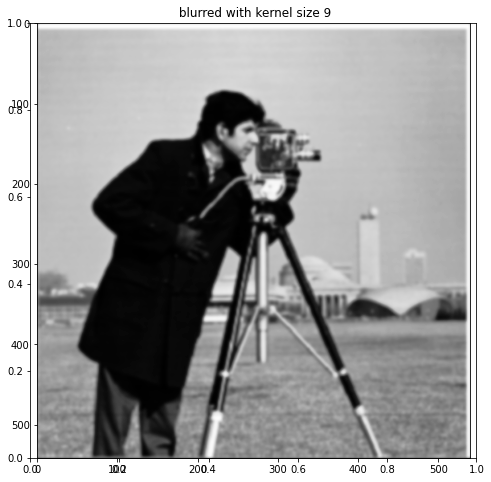

In [113]:
display_dictionary_of_images({'blurred with kernel size 9':cameraman_blurred_9}, w = 8, h = 8)

In [71]:
cameraman_blur_dx = convolve2d(cameraman_blurred_9, np.array([[1,-1]]), mode='same')
cameraman_blur_dy = convolve2d(cameraman_blurred_9, np.array([[1],[-1]]), mode='same')
cameraman_blur_magnitude = np.sqrt(cameraman_blur_dx**2 + cameraman_blur_dy**2)

**Repeating the derivative**

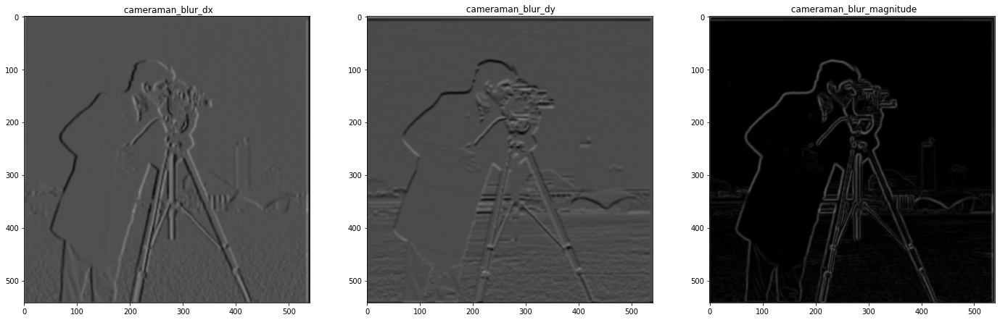

In [114]:
display_dictionary_of_images({
    'cameraman_blur_dx': cameraman_blur_dx,
    'cameraman_blur_dy': cameraman_blur_dy,
    'cameraman_blur_magnitude': cameraman_blur_magnitude
}, horiz = True, w = 8, h = 8)

**Repeating the threshold finding**
After finding the best threshold again, I decided to go with 0.045.

In [85]:
arrays_1b = []
names_1b = []
for i in np.arange(0.02, 0.08, 0.025):
    row_arr = []
    row_name = []
    for j in np.arange(0, 0.025, 0.005):
        threshold = i + j
        row_name.append(f"theshold {round(threshold,3)}")
        row_arr.append((cameraman_blur_magnitude > threshold).astype(float))
    arrays_1b.append(row_arr)
    names_1b.append(row_name)

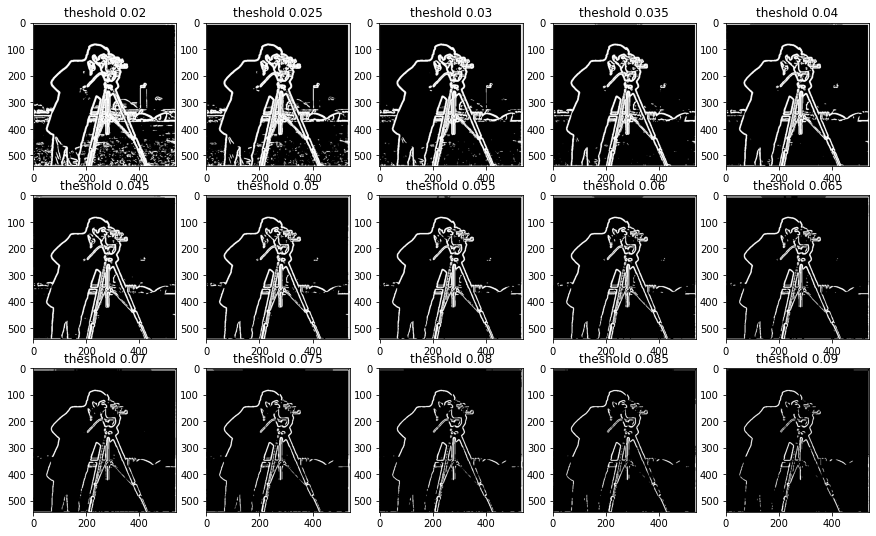

In [115]:
display_grid_of_images(arrays_1b, names_1b, w = 3, h = 3)

## Comparing gaussian + derivative with just derivative

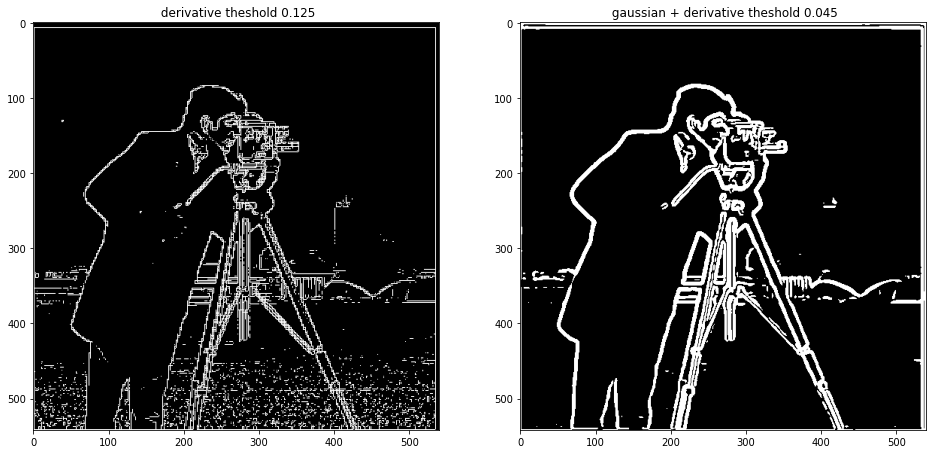

In [116]:
display_dictionary_of_images({
    "derivative " + names[1][1]:arrays[1][1],
    "gaussian + derivative " + names_1b[1][0]:arrays_1b[1][0],
}, horiz = True, w = 8, h = 8)

It is clear that in the DoG one, almost all of the edges from the original one are still there, but the noise is almost completely gone. 

## Making the DoG Filter

In [89]:
DoGx, DoGy = convolve2d(gaus2d, np.array([[1,-1]]), mode='full'), convolve2d(gaus2d, np.array([[1],[-1]]), mode='full')

In [90]:
cameraman_DoG_dx = convolve2d(cameraman, DoGx, mode='same')
cameraman_DoG_dy = convolve2d(cameraman, DoGy, mode='same')
cameraman_DoG_magnitude = np.sqrt(cameraman_DoG_dx**2 + cameraman_DoG_dy**2)

**Verifying the DoG filter does the same thing as guassian + derivative**

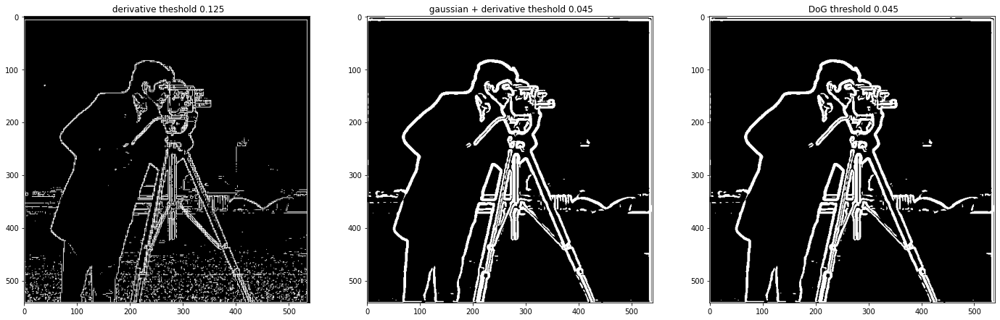

In [117]:
display_dictionary_of_images({
    "derivative " + names[1][1]:arrays[1][1],
    "gaussian + derivative " + names_1b[1][0]:arrays_1b[1][0],
    "DoG threshold 0.045" : (cameraman_DoG_magnitude > 0.045).astype(float)
}, horiz = True, w = 8, h = 8)

The DoG is exactly the same as if we applied a gaussian filter then the derivatives.

# 2. Fun with frequencies

## 2.1 unsharp mask

I wrote a helper function `convolve_color` that splits an image into colors, does the same convolution on each color channel then combines them back again.

In [154]:
def convolve_color(color_image, filt, mode):
    r, g, b = color_image[:,:,0], color_image[:,:,1], color_image[:,:,2]
    r_conv, g_conv, b_conv = convolve2d(r, filt, mode), convolve2d(g, filt, mode), convolve2d(b, filt, mode)
    return np.stack([r_conv, g_conv, b_conv], axis = 2)

### Preparing images

For this part, in addition to the taj mahal image, I'll use two of my own images:

- I'll sharpen a 564 x 810 screenshot of some blurry dashcam footage that I got from youtube ([source](https://www.youtube.com/watch?v=rBRVpGVcZuw))

- I'll use a nice and sharp 900 x 675 image that I took of somebody's BMW in a parking lot. I'll blur it with a gaussian of kernel size 11 then try to recover the original

In [173]:
taj = sk.img_as_float(skio.imread('data/taj.jpg'))
dashcam = sk.img_as_float(skio.imread('data/dashcam.png'))
bmw = sk.img_as_float(skio.imread('data/bmw.png'))
bmw_blurred = convolve_color(bmw, gaussian_filter(11), 'same')

Here are the images:

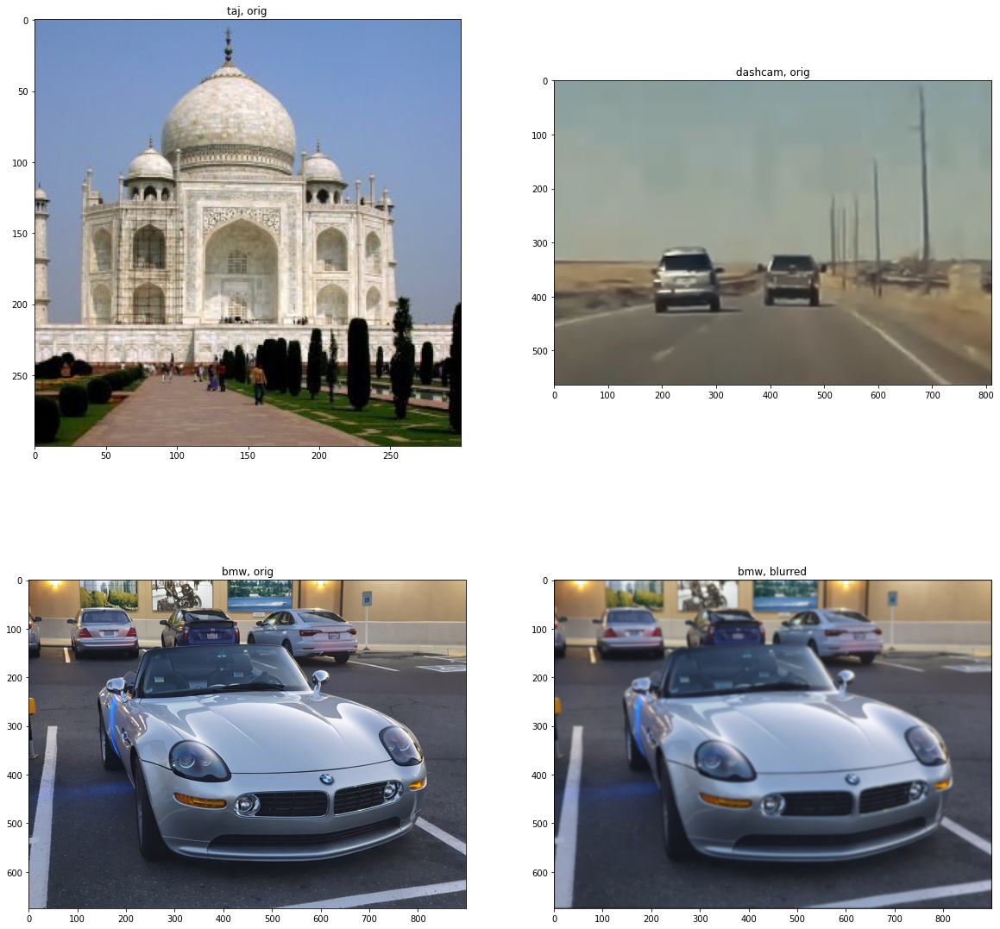

In [174]:
display_grid_of_images([[taj, dashcam],[bmw, bmw_blurred]],[['taj, orig', 'dashcam, orig'],['bmw, orig', 'bmw, blurred']], w = 10, h = 10)

Equation from lecture: $$f + \alpha(f - f * g) = (1 + \alpha) f - \alpha f * g = f * \left((1+\alpha)e - \alpha g\right)$$

I will convert this equation into a function `unsharp_mask_filter` that takes $\alpha$ and the kernel size of $g$ as arguments and returns the unsharp mask filter.

Code:

In [145]:
def unsharp_mask_filter(kernel, alpha):
    a = cv2.getGaussianKernel(kernel, -1)
    gaus2d = np.outer(a,a)
    e = np.zeros((kernel, kernel))
    e[kernel//2, kernel//2] = 1
    return ((1 + alpha) * e ) - (alpha * gaus2d)

### Picking kernel size

Next, I attempted to find the best kernel size for the gaussian. To choose this, I tried displaying $f - f * g$ for the Red channel with different kernels and visually chose the one that kept all the sharp details but none of the blurry stuff.

**for taj i chose kernel size 7 which gave the details (for red channel) that look like this**

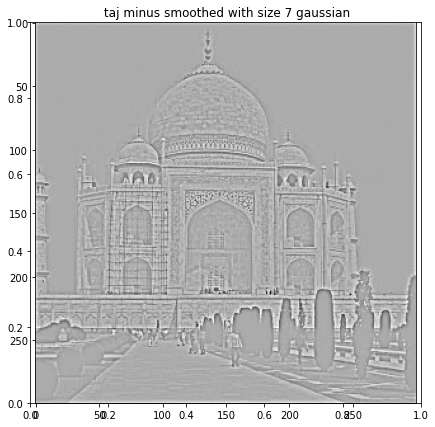

In [166]:
display_dictionary_of_images({
    "taj minus smoothed with size 7 gaussian": taj[:,:,0] - convolve2d(taj[:,:,0], gaussian_filter(7), 'same')
}, w = 7, h = 7)

**For the dashcam footage I picked 9, which made the details of the red channel look like this**

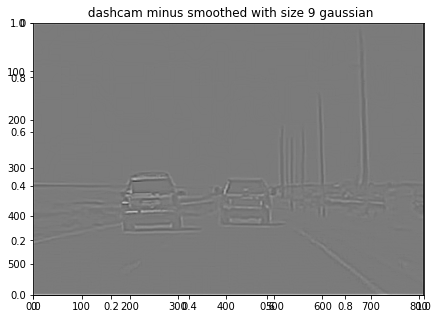

In [167]:
display_dictionary_of_images({
    "dashcam minus smoothed with size 9 gaussian": dashcam[:,:,0] - convolve2d(dashcam[:,:,0], gaussian_filter(9), 'same')
}, w = 7, h = 5)

**For the BMW image I picked 7, which made the details of the red channel look like this**

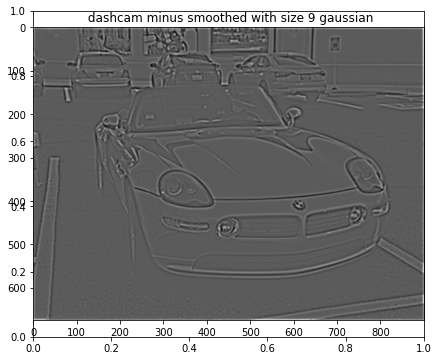

In [181]:
display_dictionary_of_images({
    "dashcam minus smoothed with size 9 gaussian": bmw_blurred[:,:,0] - convolve2d(bmw_blurred[:,:,0], gaussian_filter(7), 'same')
}, w = 7, h = 6)

### Doing the unsharp mask filtering

Now I do the unsharp mask filtering for Taj and Dashcam.

In [186]:
imagegrid_21a = []
stringgrid_21a = []
for image, name, ksize in [(taj,'taj', 7), (dashcam, 'dashcam', 9)]:
    this_row_img = [image]
    this_row_names = [f"{name}, original"]
    for alpha in [1, 2, 4]:
        unsharp_mask = unsharp_mask_filter(ksize, alpha)
        sharpened_image = convolve_color(image, unsharp_mask, 'same')
        this_row_img.append(sharpened_image)
        this_row_names.append(f"{name}, alpha = {alpha}")
    imagegrid_21a.append(this_row_img)
    stringgrid_21a.append(this_row_names)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


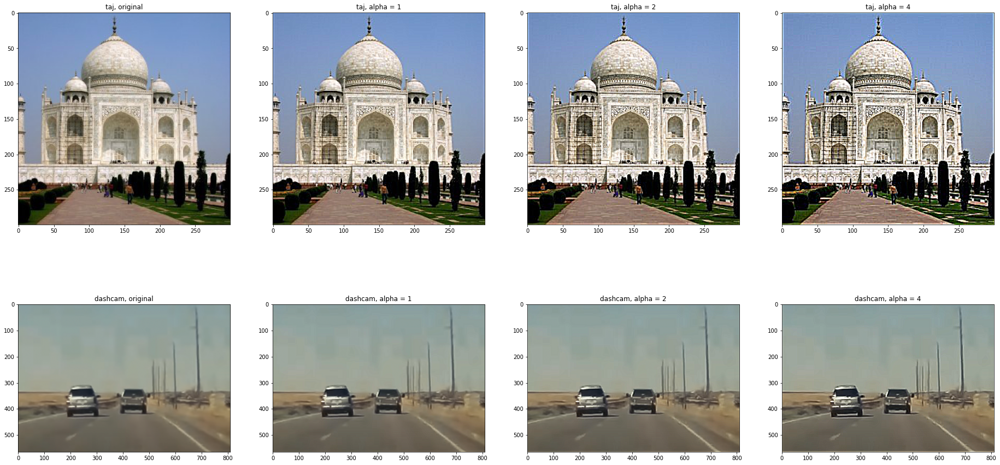

In [188]:
display_grid_of_images(imagegrid_21a, stringgrid_21a, w = 8, h = 8)

Now I will do the unsharp mask filtering for the BMW image, showing them side by side with the original and blurred. I used $\alpha = 8$ for this one, because through trial and error it was the one that looked best to me.

In [210]:
dic = {
    'bmw, original': bmw,
    'bmw, blurred' : bmw_blurred
}
unsharp_mask = unsharp_mask_filter(7, 8)
dic[f"bmw, recovered, alpha = 8"] =  convolve_color(bmw_blurred, unsharp_mask, 'same')
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


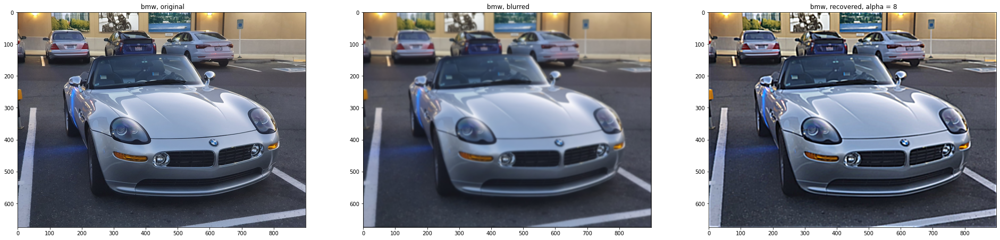

In [211]:
display_dictionary_of_images(dic,horiz = True, w = 11, h = 10)

### Observations

For the BMW image, the recovered image is much nicer to look at than the blurred image. Some details that were almost gone in the blurred version, such as the lines in the car's grille and the detail of the headlamps, are much more visible in the recovered one. However, there were other details, such as the lettering in the car's logo, that are lost forever :(

## Part 2.2.1: Hybrid Images - Dog and Monkey

The first pair of dogs I try to combine, is a dog and a monkey. I took the picture of the dog. The monkey was taken from [here.](https://news.artnet.com/art-world/peta-to-file-appeal-in-monkey-selfie-lawsuit-1020023) The monkey was rotated and scaled so that it's roughly in the same place as the dog.

I will use the monkey as the high-frequency image and the dog as the low-frequency image.

In [231]:
dog, monkey = sk.img_as_float(skio.imread('data/dog.png'))[:,:,:3], sk.img_as_float(skio.imread('data/monkey.png'))[:,:,:3]
dog_gray, monkey_gray = sk.img_as_float(skio.imread('data/dog.png', as_gray = True)), sk.img_as_float(skio.imread('data/monkey.png', as_gray = True))
dog_gray = np.stack([dog_gray]*3, axis = 2)
monkey_gray = np.stack([monkey_gray]*3, axis = 2)
dic = {'dog':dog, 'monkey':monkey, 'dog_gray': dog_gray, 'monkey_gray': monkey_gray}

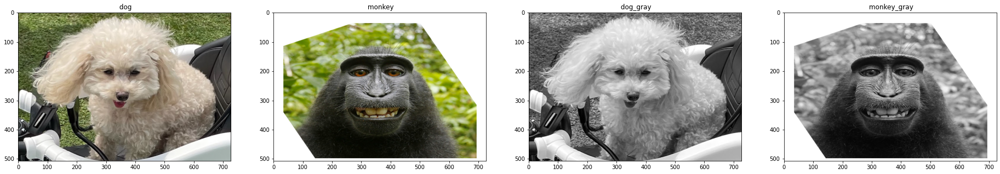

In [230]:
display_dictionary_of_images(dic, horiz = True, w = 8, h = 6)

### Finding cutoff frequency (gaussian kernel size) - dog and monkey

In [246]:
sizes = [29, 33, 37, 41, 45]
dic = {}
for size in sizes:
    filt = gaussian_filter(size)
    dog_low = convolve_color(dog_gray, filt, 'same')
    monkey_high = monkey_gray - convolve_color(monkey_gray, filt, 'same')
    dic[f"dog + monkey with cutoff size {size}"] = (dog_low + monkey_high)/2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


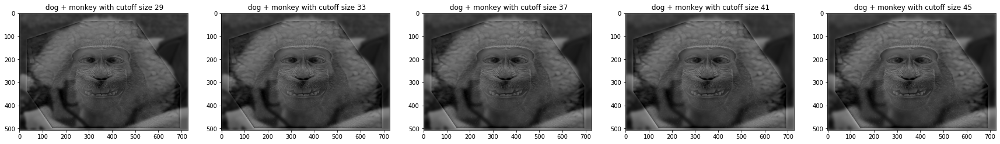

In [247]:
display_dictionary_of_images(dic, horiz = True, w = 6, h = 4)

I decided to go with 37.

### Fourier Transform analysis

I do this only for the grayscale images.

In [278]:
filt = gaussian_filter(37)

dog_2d, monkey_2d = dog_gray[:,:,0], monkey_gray[:,:,0]

dog_2d_low = convolve2d(dog_2d, filt, mode = 'same')
monkey_2d_high = monkey_2d - convolve2d(monkey_2d, filt, mode = 'same')

combined_2d = (dog_2d_low + monkey_2d_high)/1.5

frequency = lambda x: np.log(np.abs(np.fft.fftshift(np.fft.fft2(x))))
images = [
    [frequency(dog_2d), frequency(monkey_2d)],
    [frequency(dog_2d_low), frequency(monkey_2d_high)],
    [frequency(combined_2d), np.array([[1]])]
]
names = [
    ['freq - dog, original', 'freq - monkey, original'],
    ['freq - dog, low pass', 'freq - monkey, high pass'],
    ['freq - combined', '']
]



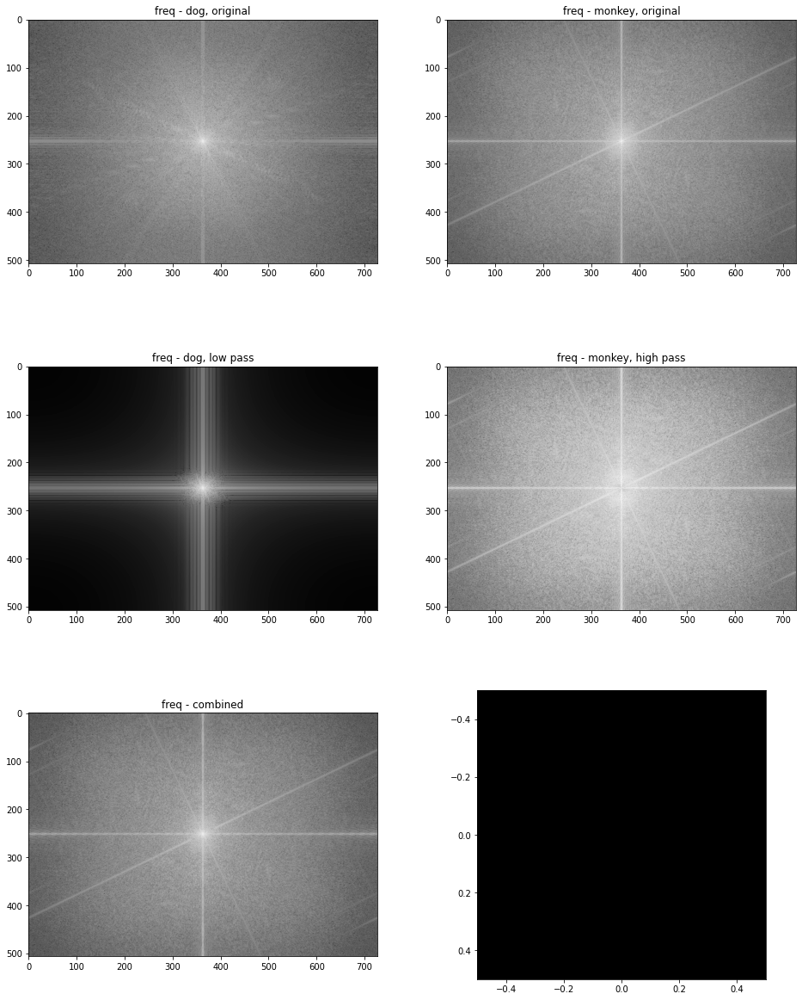

In [280]:
display_grid_of_images(images, names, w = 8, h = 7)

### Bells and whistles - color - dog and monkey

I try to use color for one of the images, and grayscale for the other one; then I try color for both. For each, I go with the cutoff size of 37.

Also, instead of averaging or summing the two layers, I sum them then divide the sum by 1.5. I found that this looks better than either averaging or summing.

In [267]:
dic = {}
filt = gaussian_filter(37)

# Monkey color
dog_low = convolve_color(dog_gray, filt, 'same')
monkey_high = monkey - convolve_color(monkey, filt, 'same')
dic[f"dog gray monkey color"] = (dog_low + monkey_high)/1.5

# Dog color
dog_low = convolve_color(dog, filt, 'same')
monkey_high = monkey_gray - convolve_color(monkey_gray, filt, 'same')
dic[f"dog color monkey gray"] = (dog_low + monkey_high)/1.5

# Both color
dog_low = convolve_color(dog, filt, 'same')
monkey_high = monkey - convolve_color(monkey, filt, 'same')
dic[f"both color"] = (dog_low + monkey_high)/1.5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


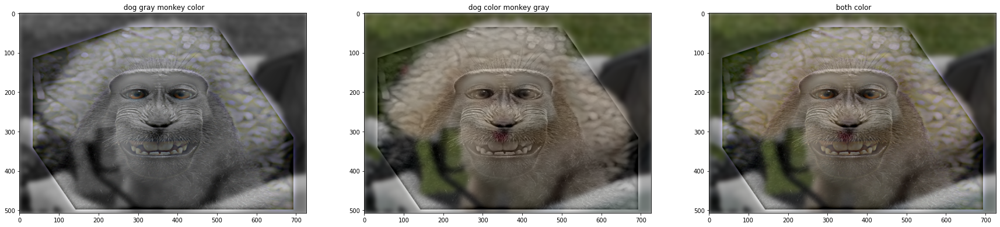

In [268]:
display_dictionary_of_images(dic, horiz = True, w = 10, h = 8)

In my opinion, the one where the dog has color but the monkey is gray provide the best blend. But that is just my opinion, and I guess it can be a matter of personal preference.

## 2.2.2: Hybrid Images, Sharkie and Airbus Beluga

For the second hybrid image, I used Sharkie, my stuffed shark plushie, and an Airbus Beluga image I found [here](https://www.maxim.com/news/airbus-beluga-xl-2018-7).

In [253]:
sharkie, beluga = sk.img_as_float(skio.imread('data/sharkie.png'))[:,:,:3], sk.img_as_float(skio.imread('data/beluga.png'))[:,:,:3]
sharkie_gray, beluga_gray = sk.img_as_float(skio.imread('data/sharkie.png', as_gray = True)), sk.img_as_float(skio.imread('data/beluga.png', as_gray = True))
sharkie_gray = np.stack([sharkie_gray]*3, axis = 2)
beluga_gray = np.stack([beluga_gray]*3, axis = 2)
dic = {'sharkie':sharkie, 'beluga':beluga, 'sharkie_gray': sharkie_gray, 'beluga_gray': beluga_gray}

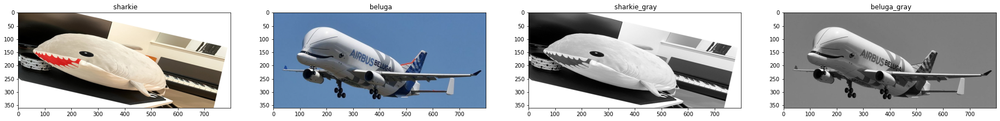

In [254]:
display_dictionary_of_images(dic, horiz = True, w = 8, h = 6)

I will use the shark as the high-frequency image and the airbus beluga as the low-frequency image.

As before, I started with grayscare to try and find the best cutoff.

In this case, I decided to use 39.

### Bells and whistles - color - Sharkie and beluga

I do the same thing as I did for the dog and monkey.

In [273]:
dic = {}
filt = gaussian_filter(31)

# shark color
beluga_low = convolve_color(beluga_gray, filt, 'same')
sharkie_high = sharkie - convolve_color(sharkie, filt, 'same')
dic[f"sharkie color airbus beluga gray"] = (beluga_low + sharkie_high)/1.5

# beluga color
beluga_low = convolve_color(beluga, filt, 'same')
sharkie_high = sharkie_gray - convolve_color(sharkie_gray, filt, 'same')
dic[f"sharkie grey airbus beluga color"] = (beluga_low + sharkie_high)/1.5

# Both color
beluga_low = convolve_color(beluga, filt, 'same')
sharkie_high = sharkie - convolve_color(sharkie, filt, 'same')
dic[f"both color"] = (beluga_low + sharkie_high)/1.5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


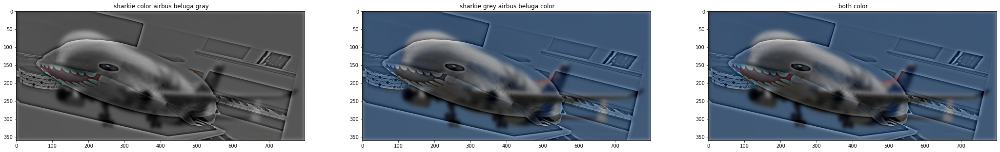

In [275]:
display_dictionary_of_images(dic, horiz = True, w = 12, h = 8)

In this case, like the previous example, I think the low frequency image (in this case the beluga) having color helps, because otherwise the sharper image tends to dominate. Although this may just be because I'm sitting too close to my screen.